In [16]:
import os
from torch.utils.data import DataLoader,Dataset
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')

sns.set(style='darkgrid', font_scale=1.2)

In [17]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [18]:
data = '/kaggle/input/anime-data/anime_dataset_reduced'

In [19]:
config = { 'batch_size'        : 16,
           'image_size'        : 64,
           'n_channel'         : 3,
           'latent_space_size' : 100,
           'feature_mapG'      : 64,
           'feature_mapD'      : 64,
           'num_epochs'        : 5,
           'lr'                : 2e-4,
           'beta1'             : 0.5,
           'device'            : 'cuda'
 
}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Device : ' , device)

num_GPU = torch.cuda.device_count()
print('Number of GPU : ', num_GPU)

Device :  cuda
Number of GPU :  2


In [30]:
from PIL import Image
class AnimeData(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.ListOfImages = [os.path.join(self.root_dir, img) for img in os.listdir(self.root_dir) if img.endswith('.png')]

    def __getitem__(self, index):
        image_path = self.ListOfImages[index]
        image = Image.open(image_path).convert('RGB')

        if self.transform is not None:
            image = self.transform(image)

        return image

    def __len__(self):
        return len(self.ListOfImages)

In [31]:
transform = tt.Compose([
    tt.ColorJitter([0.9,0.9]),
    tt.RandomGrayscale(p = 0.3),
    tt.RandomAffine((-30, 30)),
    tt.RandomPerspective(),
    tt.GaussianBlur(3),
    tt.RandomHorizontalFlip(p = 0.2),
    tt.RandomVerticalFlip(p = 0.2),
    tt.Resize(int(config['image_size'] * 1.1)),
    tt.CenterCrop(config['image_size']),
    tt.ToTensor(),
    tt.Normalize(mean = (0.5, 0.5, 0.5), std = (0.5, 0.5, 0.5))
])

print(transform)

Compose(
    ColorJitter(brightness=(0.9, 0.9), contrast=None, saturation=None, hue=None)
    RandomGrayscale(p=0.3)
    RandomAffine(degrees=[-30.0, 30.0])
    RandomPerspective(p=0.5)
    GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 2.0))
    RandomHorizontalFlip(p=0.2)
    RandomVerticalFlip(p=0.2)
    Resize(size=70, interpolation=bilinear, max_size=None, antialias=warn)
    CenterCrop(size=(64, 64))
    ToTensor()
    Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
)


In [32]:
anime_dataset = AnimeData(root_dir=data, transform=transform)

In [33]:
dataloader = DataLoader(dataset=anime_dataset,
                        shuffle=True,
                        batch_size=config['batch_size'],
                        num_workers=2,
                        drop_last=True,
                        pin_memory=True)

In [34]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0)


## **GENERATOR PART**

In [35]:
class Generator(nn.Module):
    def __init__(self, latent_space_size=config['latent_space_size'], 
                 ngf=config['feature_mapG'], n_channel=config['n_channel']):
        
        super().__init__()
        
        self.generator = nn.Sequential(
                        nn.ConvTranspose2d(in_channels=latent_space_size,
                                          out_channels = ngf*8,kernel_size=4, 
                                           stride=1, 
                                           padding=0, 
                                           bias=False),
                        nn.BatchNorm2d(num_features = ngf*8),
                        nn.ReLU(inplace=True),
            
                        nn.ConvTranspose2d(in_channels=ngf*8,
                                          out_channels = ngf*4,kernel_size=4, 
                                           stride=2, 
                                           padding=1, 
                                           bias=False),
                        nn.BatchNorm2d(num_features = ngf*4),
                        nn.ReLU(inplace=True),
            
            
                        nn.ConvTranspose2d(in_channels=ngf*4,
                                          out_channels = ngf*2,kernel_size=4, 
                                           stride=2, 
                                           padding=1, 
                                           bias=False),
                        nn.BatchNorm2d(num_features = ngf*2),
                        nn.ReLU(inplace=True),
            
            
                        nn.ConvTranspose2d(in_channels=ngf*2,
                                          out_channels = ngf,kernel_size=4, 
                                           stride=2, 
                                           padding=1, 
                                           bias=False),
                        nn.BatchNorm2d(num_features = ngf),
                        nn.ReLU(inplace=True),
            
                        # Input: ngf x 32 x 32
                        nn.ConvTranspose2d(in_channels=ngf, out_channels=n_channel, kernel_size=4, stride=2, padding=1, bias=False),  # n_channel x 64 x 64
                        nn.Tanh()
        )
        
    def forward(self, inp):
        return self.generator(inp)

In [36]:
netG = Generator().to(device)

if (device.type == 'cuda') and torch.cuda.device_count() > 1:
    netG = nn.DataParallel(netG, list(range(torch.cuda.device_count())))

netG.apply(weights_init)

DataParallel(
  (module): Generator(
    (generator): Sequential(
      (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (11): ReLU(inplace=True)
      (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=

In [37]:
!pip install torch-summary


In [38]:
from torchsummary import summary

summary(netG, (config['latent_space_size'], 1, 1))

Layer (type:depth-idx)                   Output Shape              Param #
├─Generator: 1-1                         []                        --
├─Generator: 1                           []                        --
|    └─Sequential: 2-1                   []                        --
|    └─Sequential: 2                     []                        --
|    |    └─ConvTranspose2d: 3-1         []                        819,200
├─Generator: 1-2                         [-1, 3, 64, 64]           --
├─Generator: 1                           []                        --
|    └─Sequential: 2-2                   [-1, 3, 64, 64]           --
|    └─Sequential: 2                     []                        --
|    |    └─ConvTranspose2d: 3-2         [-1, 512, 4, 4]           --
|    |    └─BatchNorm2d: 3-3             []                        1,024
|    |    └─BatchNorm2d: 3-4             [-1, 512, 4, 4]           --
|    |    └─ReLU: 3-5                    []                        --
|    | 

Layer (type:depth-idx)                   Output Shape              Param #
├─Generator: 1-1                         []                        --
├─Generator: 1                           []                        --
|    └─Sequential: 2-1                   []                        --
|    └─Sequential: 2                     []                        --
|    |    └─ConvTranspose2d: 3-1         []                        819,200
├─Generator: 1-2                         [-1, 3, 64, 64]           --
├─Generator: 1                           []                        --
|    └─Sequential: 2-2                   [-1, 3, 64, 64]           --
|    └─Sequential: 2                     []                        --
|    |    └─ConvTranspose2d: 3-2         [-1, 512, 4, 4]           --
|    |    └─BatchNorm2d: 3-3             []                        1,024
|    |    └─BatchNorm2d: 3-4             [-1, 512, 4, 4]           --
|    |    └─ReLU: 3-5                    []                        --
|    | 

In [39]:
batch = next(iter(dataloader))
print(batch.size())

torch.Size([16, 3, 64, 64])


## **DISCRIMINATOR**

In [40]:
class Discriminator(nn.Module):
    def __init__(self,n_channel = config['n_channel'], ndf = config['feature_mapD']):
        super(Discriminator,self).__init__()

        self.discriminator = nn.Sequential(
            nn.Conv2d(n_channel, ndf, 4, 2, 1, bias=False),
                nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 2),
                nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 4),
                nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 8),
                nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
                nn.Sigmoid()
            )
    
    @staticmethod
    def linear_block(in_ftrs,out_ftrs,p):
        return nn.Sequential(
            nn.Linear(in_ftrs,out_ftrs),
            nn.BatchNorm1d(out_ftrs),
            nn.ReLU(),
            nn.Dropout(p)
        )

    
    def forward(self,inp):
        return self.discriminator(inp)

In [41]:
netD = Discriminator().to(device)

if (device.type == 'cuda') and torch.cuda.device_count() > 1:
    netD = nn.DataParallel(netD, list(range(torch.cuda.device_count())))

netD.apply(weights_init)

DataParallel(
  (module): Discriminator(
    (discriminator): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
      (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=Fa

In [42]:
from torchsummary import summary

summary(netD, (config['n_channel'], 64, 64))


Layer (type:depth-idx)                   Output Shape              Param #
├─Discriminator: 1-1                     []                        --
├─Discriminator: 1                       []                        --
|    └─Sequential: 2-1                   []                        --
|    └─Sequential: 2                     []                        --
|    |    └─Conv2d: 3-1                  []                        3,072
├─Discriminator: 1-2                     [-1, 1, 1, 1]             --
├─Discriminator: 1                       []                        --
|    └─Sequential: 2-2                   [-1, 1, 1, 1]             --
|    └─Sequential: 2                     []                        --
|    |    └─Conv2d: 3-2                  [-1, 64, 32, 32]          --
|    |    └─LeakyReLU: 3-3               []                        --
|    |    └─LeakyReLU: 3-4               [-1, 64, 32, 32]          --
|    |    └─Conv2d: 3-5                  []                        --
|    |    └─

Layer (type:depth-idx)                   Output Shape              Param #
├─Discriminator: 1-1                     []                        --
├─Discriminator: 1                       []                        --
|    └─Sequential: 2-1                   []                        --
|    └─Sequential: 2                     []                        --
|    |    └─Conv2d: 3-1                  []                        3,072
├─Discriminator: 1-2                     [-1, 1, 1, 1]             --
├─Discriminator: 1                       []                        --
|    └─Sequential: 2-2                   [-1, 1, 1, 1]             --
|    └─Sequential: 2                     []                        --
|    |    └─Conv2d: 3-2                  [-1, 64, 32, 32]          --
|    |    └─LeakyReLU: 3-3               []                        --
|    |    └─LeakyReLU: 3-4               [-1, 64, 32, 32]          --
|    |    └─Conv2d: 3-5                  []                        --
|    |    └─

In [43]:
criterion = nn.BCELoss()

In [44]:
# For generator
fixed_noise = torch.randn(64, config['latent_space_size'], 1, 1, device=device)

In [46]:
import torch.optim as optim
optimizerD = optim.Adam(netD.parameters(), lr=config['lr'], betas=(config['beta1'], 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=config['lr'], betas=(config['beta1'], 0.999))

In [66]:
checkpoint_dir = './checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)

In [67]:
def save_model(epoch, model, optimizer, loss, path):
    state = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss,
    }
    torch.save(state, path)

In [68]:
G_losses = []
D_losses = []
img_list = []

print("Starting Training Loop...")
for epoch in range(config['num_epochs']):
    for i, data in enumerate(dataloader, 0):
       
        netD.zero_grad()
        real_cpu = data.to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), 1., dtype=torch.float, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, config['latent_space_size'], 1, 1, device=device)
        fake = netG(noise)
        label.fill_(0.)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        
        netG.zero_grad()
        label.fill_(1.)  
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if i % 50 == 0:
            print(f'[{epoch}/{config["num_epochs"]}][{i}/{len(dataloader)}] '
                  f'Loss_D: {errD.item():.4f} Loss_G: {errG.item():.4f} '
                  f'D(x): {D_x:.4f} D(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}')

        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if i % 500 == 0:
            save_model(epoch, netG, optimizerG, errG.item(), f'{checkpoint_dir}/G_epoch_{epoch}_batch_{i}.pth')
            save_model(epoch, netD, optimizerD, errD.item(), f'{checkpoint_dir}/D_epoch_{epoch}_batch_{i}.pth')

    with torch.no_grad():
        fake = netG(fixed_noise).detach().cpu()
    img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

    save_model(epoch, netG, optimizerG, errG.item(), f'{checkpoint_dir}/G_epoch_{epoch}.pth')
    save_model(epoch, netD, optimizerD, errD.item(), f'{checkpoint_dir}/D_epoch_{epoch}.pth')

print("Training completed.")

Starting Training Loop...
[0/5][0/500] Loss_D: 0.4357 Loss_G: 3.0635 D(x): 0.8193 D(G(z)): 0.1671 / 0.0619
[0/5][50/500] Loss_D: 0.6135 Loss_G: 2.7541 D(x): 0.7716 D(G(z)): 0.2349 / 0.0871
[0/5][100/500] Loss_D: 0.6369 Loss_G: 4.1018 D(x): 0.8707 D(G(z)): 0.3361 / 0.0250
[0/5][150/500] Loss_D: 0.5376 Loss_G: 2.7211 D(x): 0.8013 D(G(z)): 0.2462 / 0.0758
[0/5][200/500] Loss_D: 0.7373 Loss_G: 3.2997 D(x): 0.8860 D(G(z)): 0.3887 / 0.0564
[0/5][250/500] Loss_D: 1.5211 Loss_G: 1.2495 D(x): 0.3506 D(G(z)): 0.0643 / 0.3675
[0/5][300/500] Loss_D: 0.6204 Loss_G: 3.1806 D(x): 0.7933 D(G(z)): 0.2709 / 0.0531
[0/5][350/500] Loss_D: 1.1722 Loss_G: 1.3598 D(x): 0.4303 D(G(z)): 0.0921 / 0.3209
[0/5][400/500] Loss_D: 0.6320 Loss_G: 2.5389 D(x): 0.7806 D(G(z)): 0.2575 / 0.1033
[0/5][450/500] Loss_D: 0.8399 Loss_G: 3.5287 D(x): 0.7086 D(G(z)): 0.3013 / 0.0407
[1/5][0/500] Loss_D: 0.7398 Loss_G: 1.8406 D(x): 0.6585 D(G(z)): 0.2080 / 0.1857
[1/5][50/500] Loss_D: 0.7800 Loss_G: 1.3682 D(x): 0.6732 D(G(z)): 

In [72]:
save_model(config['num_epochs'], netG, optimizerG, G_losses[-1], 'generator_final.pth')
save_model(config['num_epochs'], netD, optimizerD, D_losses[-1], 'discriminator_final.pth')

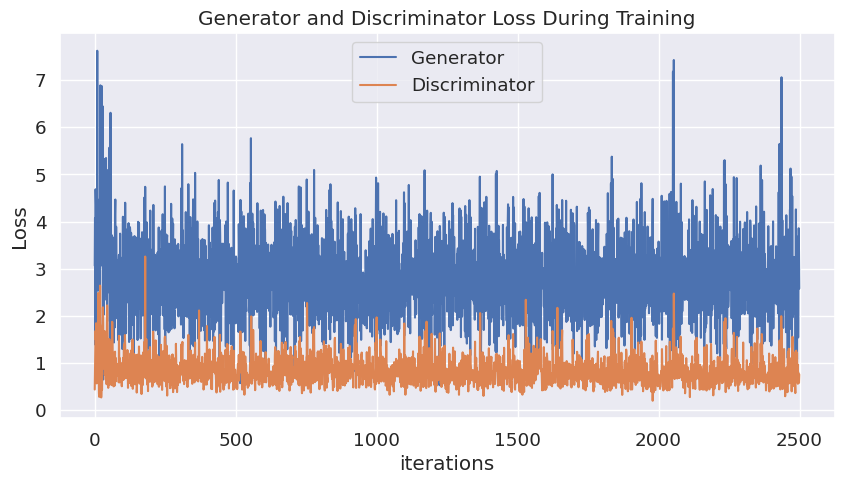

In [73]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="Generator")
plt.plot(D_losses,label="Discriminator")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()
     

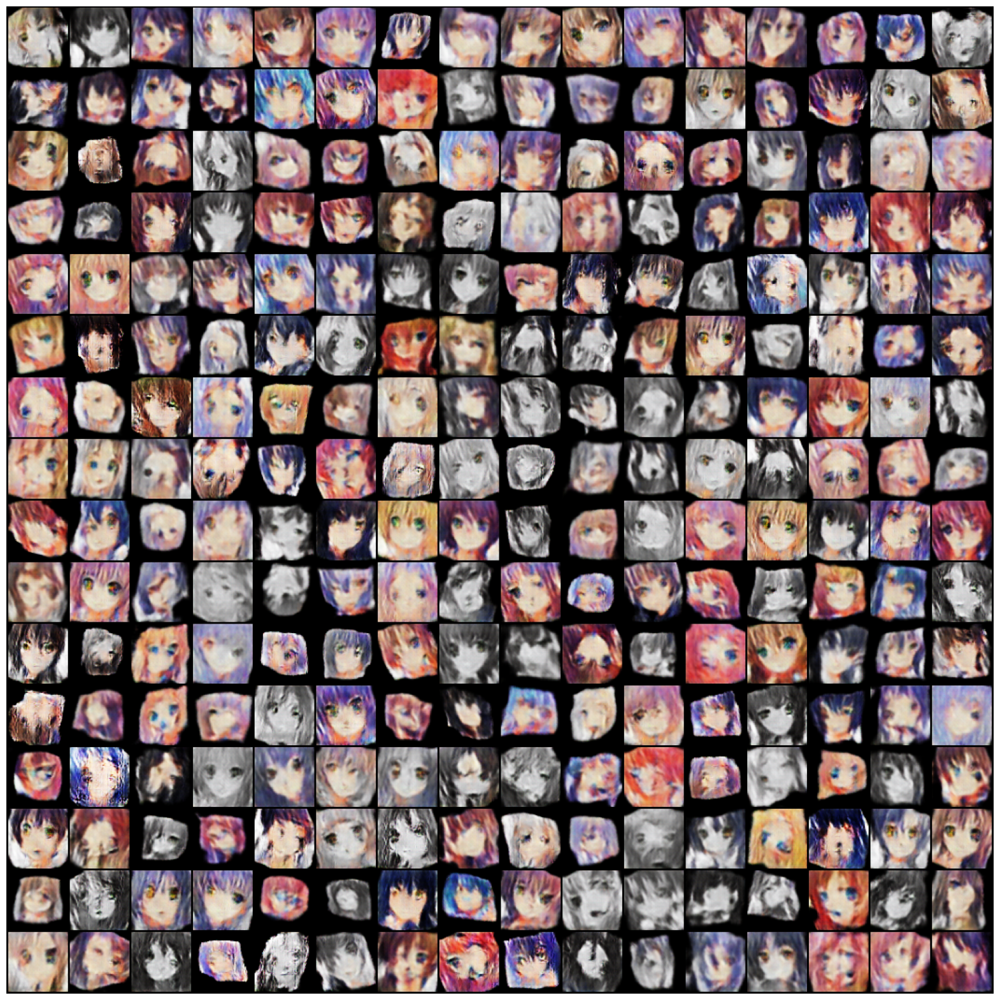

In [74]:
with torch.no_grad():
    netG.eval()
    fakes = netG(torch.randn(256,100,1,1, dtype = torch.float , device = device))

plt.figure(figsize = (20,35))
plt.axis('off')
plt.imshow(vutils.make_grid(fakes, padding=2, normalize=True , nrow= 16).cpu().permute(1,2,0))
     

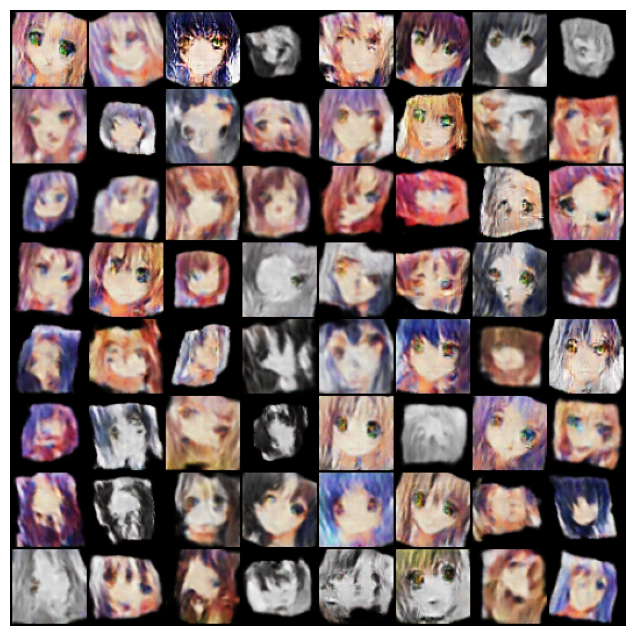

In [75]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8,8))
plt.axis("off")

# Prepare a list of images for the animation
ims = []
for grid in img_list:
    img = grid.permute(1, 2, 0).cpu().numpy()
    im = plt.imshow(img, animated=True)
    ims.append([im])

# Create the animation
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

# Display the animation
HTML(ani.to_jshtml())


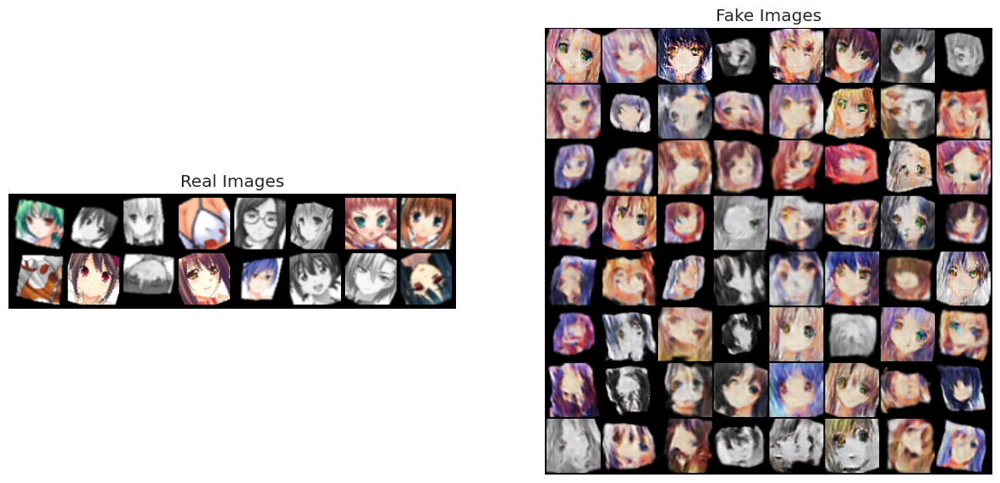

In [76]:
import numpy as np
import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Get a batch of real images
real_batch = next(iter(dataloader))

plt.figure(figsize=(15, 15))

# Display real images
plt.subplot(1, 2, 1)
plt.axis("off")
plt.title("Real Images")
real_images = vutils.make_grid(real_batch[:64], padding=5, normalize=True)
plt.imshow(np.transpose(real_images.cpu(), (1, 2, 0)))

# Display fake images
plt.subplot(1, 2, 2)
plt.axis("off")
plt.title("Fake Images")
fake_images = img_list[-1]
plt.imshow(np.transpose(fake_images.cpu(), (1, 2, 0)))

plt.show()


In [77]:
print(f'Final Generator Loss: {G_losses[-1]:.4f}')
print(f'Final Discriminator Loss: {D_losses[-1]:.4f}')

Final Generator Loss: 2.5789
Final Discriminator Loss: 0.7551
